# Libraries

In [1]:
suppressPackageStartupMessages({
    library(data.table)
    library(dplyr)
    library(glue)
    library(ggplot2)
    library(sf)
    library(patchwork)
    library(ggthemes)
    library(purrr)
    library(Matrix)
    library(tidyr)
})
fig.size <- function(h, w) {
    options(repr.plot.height = h, repr.plot.width = w)
}


# Data

In [2]:
obj = readRDS('joint_aggs_share.rds')


The data object has 3 fields: cells, tiles, and bboxes. 

The bounding boxes are there for plotting all samples in one frame. 



In [3]:
names(obj)

[1] "cells"  "tiles"  "bboxes"

Cells and tiles are linked by the "agg_id" field in cells. 


In [4]:
head(obj$cells$meta_data$agg_id)


[1] 76270 76271 76272 76273 76274 76275

agg_id points directly into tiles meta_data: 

In [5]:
## EXAMPLE
## find all tiles with at least 1 mregDC
i = unique(obj$cells$meta_data[grepl('mreg', cleaned_fine_types, ignore.case = TRUE)]$agg_id)
## Get counts of some genes in these mregDC containing tiles
rowSums(obj$tiles$counts[c('CCL17', 'CCL19', 'LAMP3'), i])


CCL17 CCL19 LAMP3 
 5359 21979 27077

## Cells

I kept only the meta data about cells here, to avoid duplicating data. 


In [6]:
head(obj$cells$meta_data)

X,Y,ORIG_ID,sample_id,condition,fov,ClusterTop,cleaned_fine_types,cleaned_type_types_confidence,avg_assignment_confidence,geneformer,geneformer_ClusterTop,agg_id
<dbl>,<dbl>,<int>,<chr>,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<int>
29540.82,22251.49,1,C107,MSI,14,Strom,cS27 (CXCL14+ CAF),0.4578561,0.8250794,gTNI02 (TNI_CD4_IL17),TNKILC,76270
29652.52,23277.83,3,C107,MSI,9,Strom,cS15/16/17/18/19 (Pericyte),1.0000000,0.8740984,gE3 (Epi_Entero2)_d,Epi,76271
29658.82,20914.36,4,C107,MSI,21,Strom,cS31 (CAF stem niche Fibro-like),0.5969292,0.7896000,gS13 (S_Fibro_GREM1CAF),Strom,76272
29657.23,22948.43,5,C107,MSI,11,Epi,cE01 (Stem/TA-like),0.8933806,0.7780000,gE3 (Epi_Entero2)_d,Epi,76273
29597.83,22639.23,6,C107,MSI,12,Myeloid,cM10 (Granulocyte),0.7468941,0.8692857,gM2 (M_Macro),Myeloid,76274
29620.65,16392.49,7,C107,MSI,43,Strom,cS23/cS24 (Fibro BMP-producing),0.7027727,0.8500000,gS08 (S_Fibro_Stem),Strom,76275


To index back into the original cell-based objects, use the `ORIG_ID` column. 


In [7]:
obj$cells$meta_data %>% 
    split(.$sample_id) %>% 
    map('ORIG_ID') %>% 
    map(range)


$C107
[1]      1 127345

$C110
[1]     32 155685

$C123
[1]      2 306754

$C164
[1]     19 469680

$C167
[1]     1 16578

$G4209
[1]      1 453910

$G4423
[1]   4192 319361

$G4554
[1]      1 553806

$G4595
[1]      1 612153

$G4630
[1]      2 364528

$`G4659-CP-MET_Beta8`
[1]  18557 400168

$`G4659-CP-MET_VMSC04701`
[1]      2 185722

$G4669_reg0
[1]    21 47379

$G4669_reg1
[1]   3869 146094

$G4671
[1]      1 404514

$G4712_Beta10
[1]      5 422751

$G4712_Beta8
[1]      1 553959

$G4738_Beta10_06
[1]   1240 312303

$G4738_Beta10_08
[1]   1535 331957

$Jax001
[1]      1 533141

## Tiles

This has a little more information, particularly about intermediate results. 

- counts: dgCMatrix of counts for each tile, genes-by-cells. 
- logcpx: dgCMatrix of log-counts-per-X normalized counts. Here, X is the median read depth over all tiles. 
- udv: embeddings, loadings, and vargene info from PCA. 
- H: Harmonized embeddings of tiles. 
- UH: uwot UMAP results, run on harmonized PCs. Including both embeddings and fgraph for clustering. 
- edges: table describing physical adjacency of tiles. 


In [8]:
names(obj$tiles)

[1] "meta_data" "counts"    "logcpx"    "edges"     "udv"       "H"        
[7] "UH"

In [9]:
head(obj$tiles$meta_data)

X,Y,npts,shape,area,perimeter,type1,keep,sample_id,fov,condition,cluster
<dbl>,<dbl>,<dbl>,<GEOMETRY>,<dbl>,<dbl>,<chr>,<lgl>,<chr>,<chr>,<chr>,<fct>
27798.71,49814.30,48,POLYGON ((27786.72 49775.86...,4681.8490,641.4924,muscle,TRUE,G4659-CP-MET_Beta8,G4659-CP-MET_Beta8_127,MSS,3
27926.84,50586.27,55,POLYGON ((27913.14 50548.92...,5874.4560,566.1131,muscle,TRUE,G4659-CP-MET_Beta8,G4659-CP-MET_Beta8_194,MSS,3
27767.80,50225.81,56,"POLYGON ((27732.34 50223.2,...",4743.5783,283.1599,muscle,TRUE,G4659-CP-MET_Beta8,G4659-CP-MET_Beta8_125,MSS,3
27878.06,50136.15,36,"POLYGON ((27870.6 50109.32,...",5252.9696,641.9552,muscle,TRUE,G4659-CP-MET_Beta8,G4659-CP-MET_Beta8_126,MSS,9
27924.08,50674.75,7,POLYGON ((27910.06 50661.16...,782.1091,144.3994,other,TRUE,G4659-CP-MET_Beta8,G4659-CP-MET_Beta8_195,MSS,8
27806.57,49896.96,45,POLYGON ((27787.45 49865.01...,3469.1620,396.8194,muscle,TRUE,G4659-CP-MET_Beta8,G4659-CP-MET_Beta8_127,MSS,4


In [10]:
names(obj$tiles$udv)

[1] "loadings"   "embeddings" "vargenes"

In [11]:
head(obj$tiles$H)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20
G4659-CP-MET_Beta8_697,6.612419,2.971075,-1.6825129,1.2528933,1.3426188,-0.2725147,-0.04566353,-0.2815279,0.5593784,0.1662499,-1.3912480,1.5645228,-0.2377997,-1.9479591,-2.5586498,-1.32241865,-0.82662307,-0.984629733,-0.2907538,-0.84407071
G4659-CP-MET_Beta8_698,8.231106,2.730366,-2.8955643,1.6554116,1.0106322,-2.2266023,1.27269014,1.4283740,0.4700566,-0.3084733,-1.4861388,-1.4389110,-1.4831001,-0.9857472,0.6107114,0.12416099,-0.63281284,-0.329177473,-1.4033408,-0.19858984
G4659-CP-MET_Beta8_701,7.750794,1.973930,-1.7075491,1.4620828,0.1815475,-0.5810385,0.35354241,0.1203070,1.0573082,-0.1775968,-0.1514507,-0.2796424,-0.5909743,-0.9141264,0.3856728,-0.03233033,-0.04132857,0.004336437,-0.5350887,0.01182166
G4659-CP-MET_Beta8_705,9.197244,-0.517156,-3.6303803,-1.1023662,-1.1474966,-1.4433707,1.61125559,0.5602892,-1.8537488,-1.1636727,-0.3248621,-0.1079139,-0.2477200,-1.0369158,0.3356823,0.05364755,-0.02460975,-0.555776309,-0.3197797,0.43909947
G4659-CP-MET_Beta8_707,8.308047,4.851129,0.2734029,0.8226779,1.1099371,2.1260610,2.86146477,-1.0926996,-3.1931350,-0.4947483,-0.7066382,-0.1116836,1.4671528,0.5964571,2.2302023,-1.25140068,1.19097640,-0.060783764,0.4988607,0.93974470
G4659-CP-MET_Beta8_708,5.999516,4.453996,-0.7745912,2.2051228,0.9452981,-0.4256727,0.56187482,-1.1013445,0.2298846,-0.2663043,-0.4347636,0.9186065,-1.1708668,-2.8697216,-0.8314441,-1.40429322,-0.37013893,-0.128998883,-1.0043185,-0.84644461


In [12]:
names(obj$tiles$UH)

[1] "embedding" "fgraph"

In [13]:
head(obj$tiles$edges)

from,to,sample_id
<int>,<int>,<chr>
4,61,G4659-CP-MET_Beta8
4,43,G4659-CP-MET_Beta8
4,21,G4659-CP-MET_Beta8
5,59,G4659-CP-MET_Beta8
5,72,G4659-CP-MET_Beta8
6,8,G4659-CP-MET_Beta8


## bboxes

For completeness, here are the bounding boxes of the samples, for plotting. 


In [14]:
head(obj$bboxes)

sample_id,x0,x1,y0,y1,condition
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
C107,29215,38479.52,12541,26085.76,MSI
C110,37880,45942.22,26086,34772.88,MSI
C123,13739,23958.42,44412,50568.83,MSI
C164,0,13738.66,33256,44298.79,MSI
C167,29215,37089.26,26086,30097.98,MSI
G4209,27401,37879.65,32766,42888.78,MSI


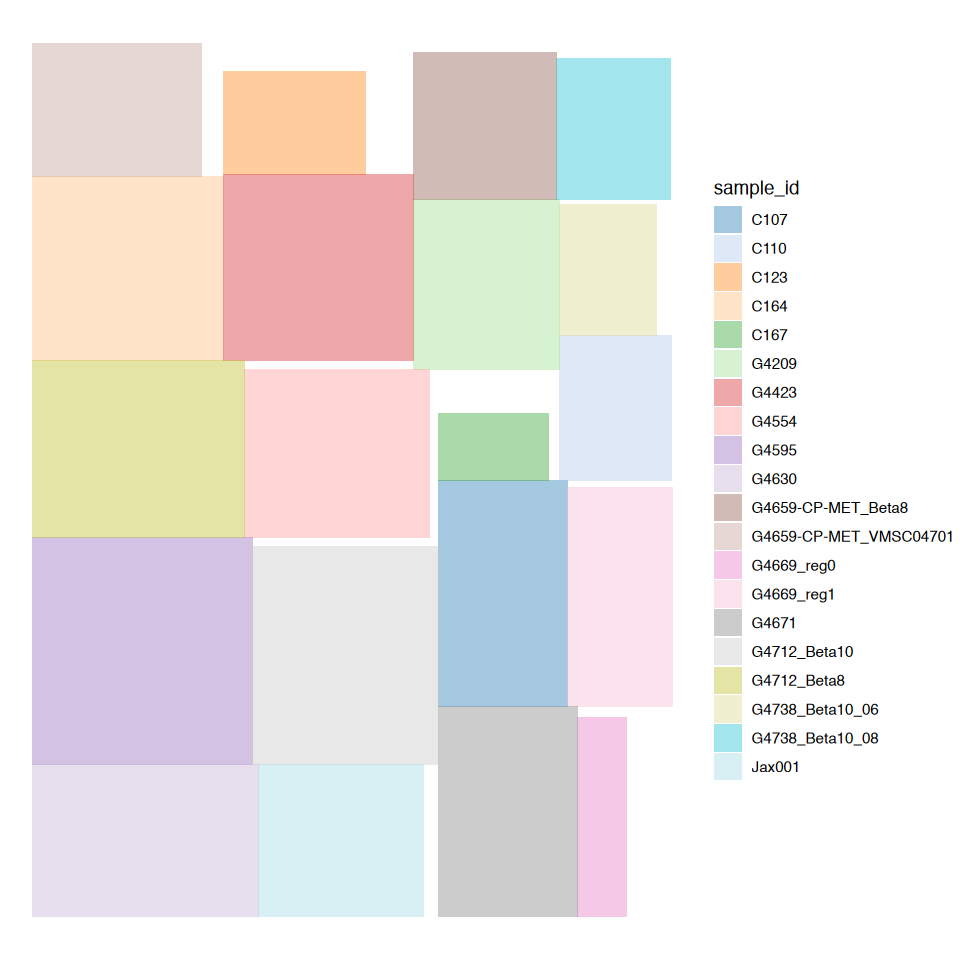

In [15]:
fig.size(8, 8)
ggplot() + 
    geom_rect(aes(xmin=x0, xmax=x1, ymin=y0, ymax=y1, fill = sample_id), obj$bboxes, alpha = .4) +
    scale_fill_tableau('Classic 20') + 
    theme_void()


# Plots 

## UMAP

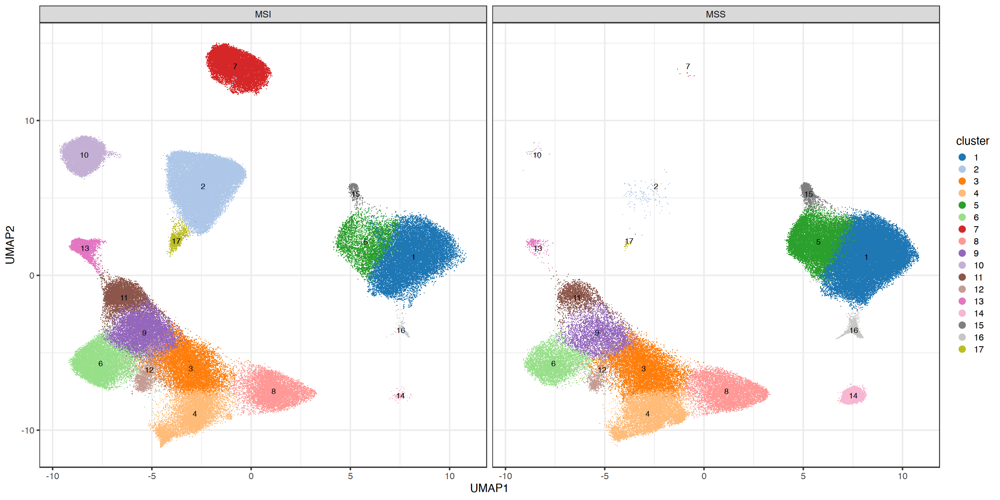

In [16]:
plt_df = cbind(obj$tiles$meta_data, obj$tiles$UH$embedding)

fig.size(10, 20)
ggplot(plt_df) + 
    geom_point(aes(V1, V2, color = cluster), shape = '.') + 
    geom_text(aes(V1, V2, label = cluster), plt_df[, .(V1 = mean(V1), V2 = mean(V2)), by = cluster]) + 
    scale_color_tableau('Classic 20') + 
    labs(x = 'UMAP1', y = 'UMAP2') + 
    guides(color = guide_legend(override.aes = list(stroke = 1, alpha = 1, shape = 16, size = 4)), alpha = "none") + 
    theme_bw(base_size = 16) + 
    facet_wrap(~condition, nrow = 1) + 
    NULL


## Zoomed out 

First, let's see the clusters in space. 


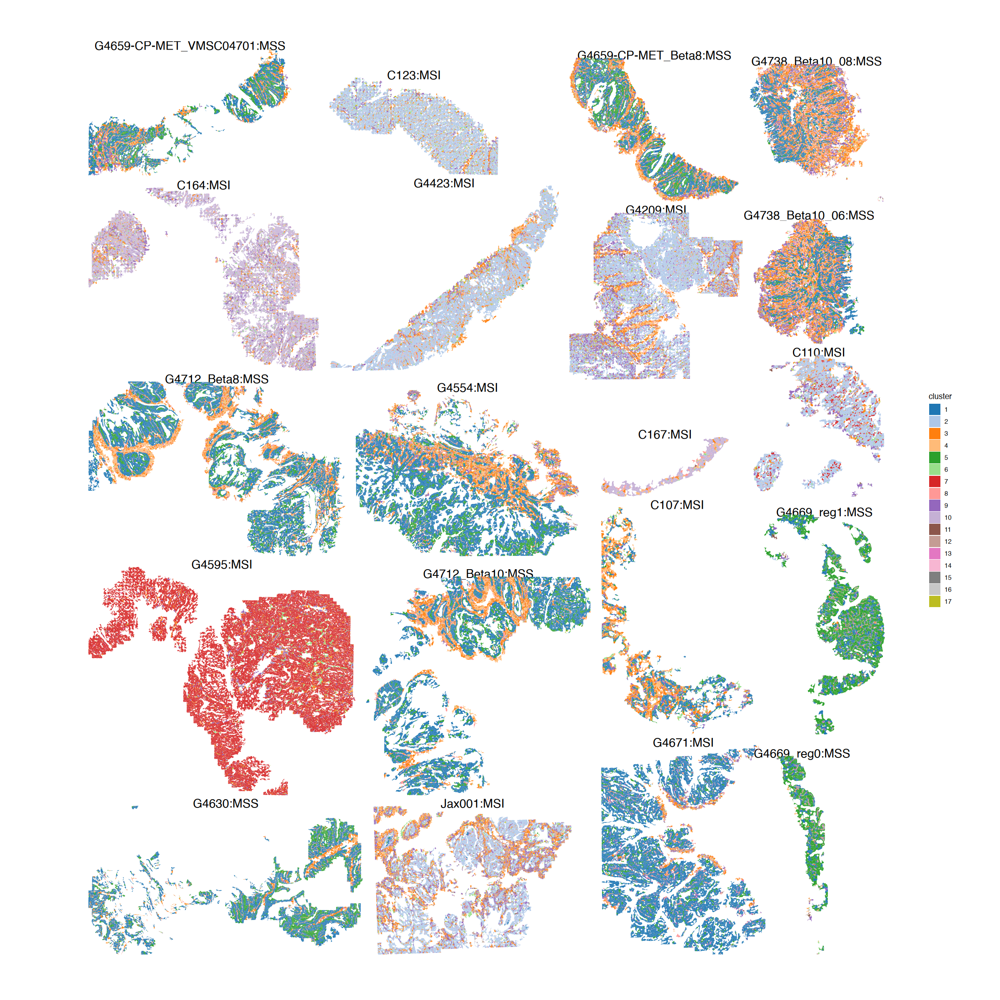

In [17]:
fig.size(20, 20)
ggplot() + 
    geom_text(data = obj$bboxes, aes(.5*(x0+x1), y1 - 150, label = glue('{sample_id}:{condition}')), size = 6) + 
    geom_sf(data = obj$tiles$meta_data, aes(geometry = shape, fill = cluster), color = NA) + 
    coord_sf(expand = TRUE) + 
    theme_void() + 
    scale_color_tableau('Classic 20') + 
    scale_fill_tableau('Classic 20') + 
    NULL


Next, let's explore gene expression in space. 

In [18]:
fig.size(10, 10)
plt_df = obj$tiles$meta_data %>% 
    cbind(VAL = rowMeans(scale(t(obj$tiles$logcpx[c('CXCL9', 'CXCL10', 'CXCL11'), ])))) ## mean scaled expression 
plt_df = plt_df[sample(.N)] ## shuffle


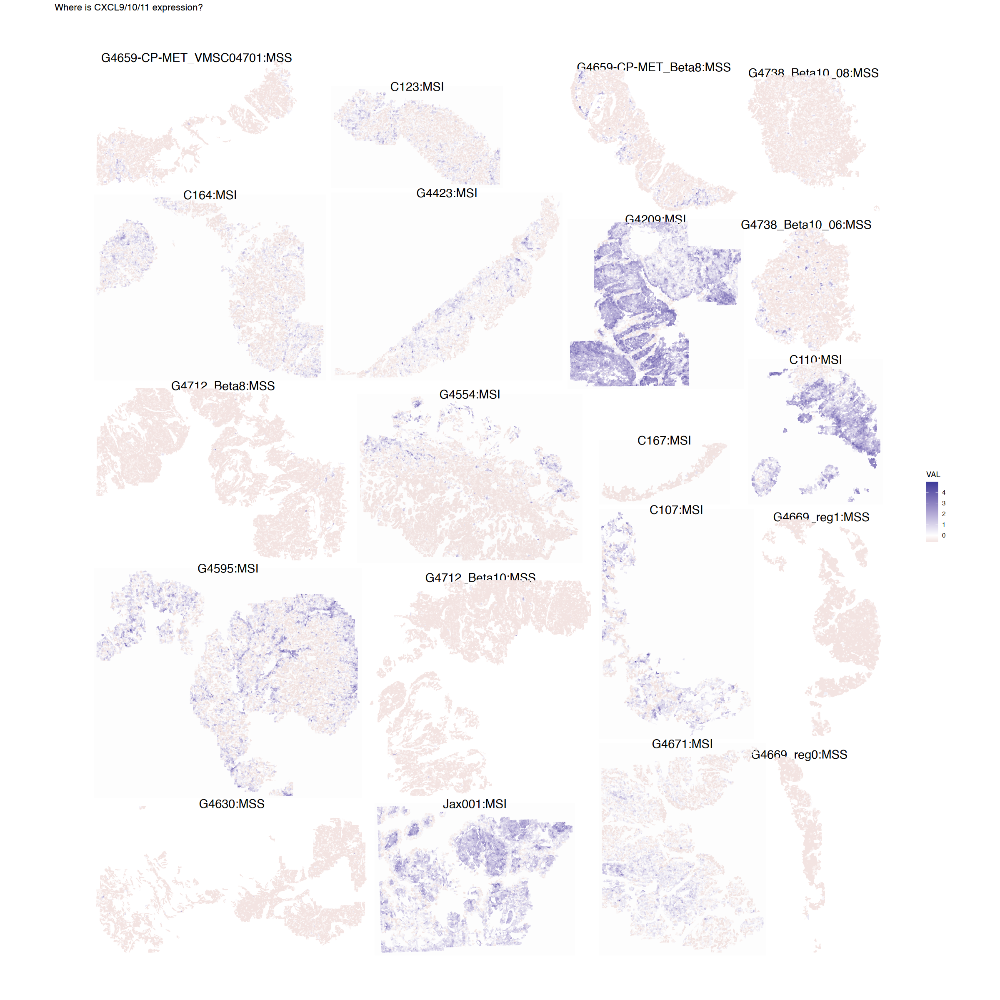

In [19]:
fig.size(20, 20)
ggplot() + 
    geom_text(data = obj$bboxes, aes(.5*(x0+x1), y1 - 150, label = glue('{sample_id}:{condition}')), size = 6) + 
    geom_sf(
        data = plt_df, 
        aes(geometry = shape, fill = VAL, color = VAL)
    ) + 
    geom_rect(data = obj$bboxes[condition == 'MSI'], aes(xmin=x0 + 150, xmax=x1 - 150, ymin=y0 + 150, ymax=y1 - 150), fill = 'grey', color = NA, alpha = .02) + 
    coord_sf(expand = TRUE) + 
    theme_void() + 
    scale_fill_gradient2() + scale_color_gradient2() + 
    labs(title = 'Where is CXCL9/10/11 expression?') + 
    NULL


## Zoom in 

Sometimes we want to zoom in and look at a couple of tiles. 


In [20]:
## Which tiles have lots of mregDCs? 
obj$cells$meta_data[grepl('mreg', cleaned_fine_types, ignore.case = TRUE), .N, by = agg_id][order(-N)] %>% head


agg_id,N
<int>,<int>
186823,9
187154,9
186999,8
187355,8
180871,7
128563,7


In [21]:
refocus_bbox = function(shapes) {
    if (length(shapes) == 1) {
        shapes = st_sfc(st_polygon(shapes[[1]]))
    } else {
        shapes = shapes %>% map(identity) %>% st_sfc() 
    }
    return(shapes)
}


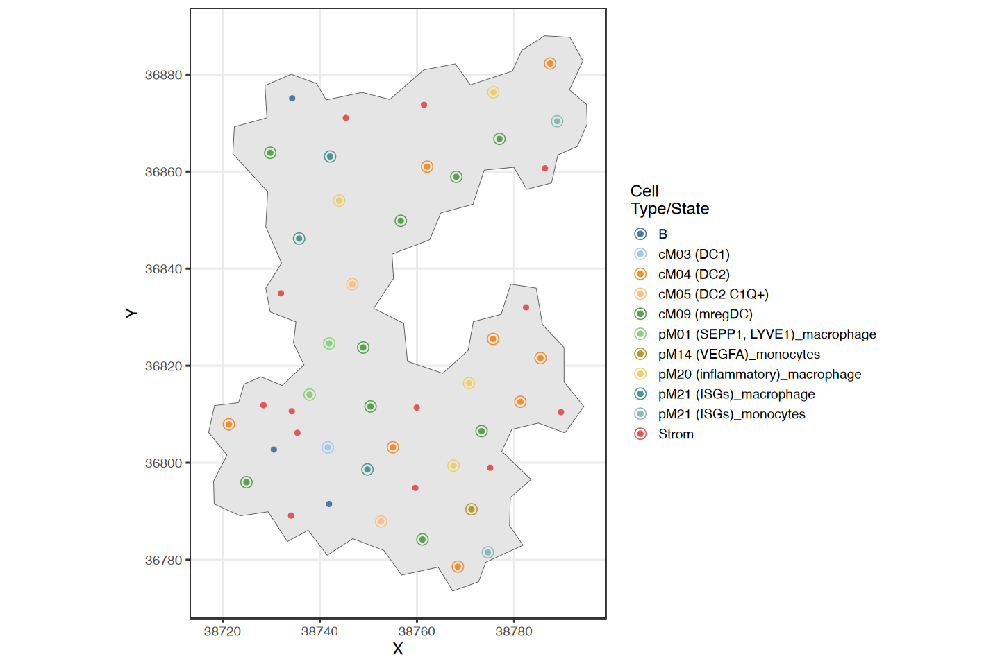

In [22]:
i_tiles = 186823
i_cells = which(obj$cells$meta_data$agg_id == i_tiles)
plt_tiles = obj$tiles$meta_data[i_tiles, ][, shape := refocus_bbox(shape)]

fig.size(8, 12)
ggplot() + 
    geom_sf(aes(geometry = st_sfc(shape)), plt_tiles) + 
    geom_point(aes(X, Y, color = ClusterTop), obj$cells$meta_data[i_cells, ][ClusterTop != 'Myeloid']) + 
    geom_point(aes(X, Y, color = cleaned_fine_types), obj$cells$meta_data[i_cells, ][ClusterTop == 'Myeloid']) + 
    geom_point(aes(X, Y, color = cleaned_fine_types), shape = 21, fill = NA, obj$cells$meta_data[i_cells, ][ClusterTop == 'Myeloid'], size = 4) + 
    coord_sf() + 
    theme_bw(base_size = 14) + 
    scale_color_tableau('Tableau 20') + 
    labs(color = 'Cell\nType/State') + 
    NULL


Where is this tile located in the sample? 

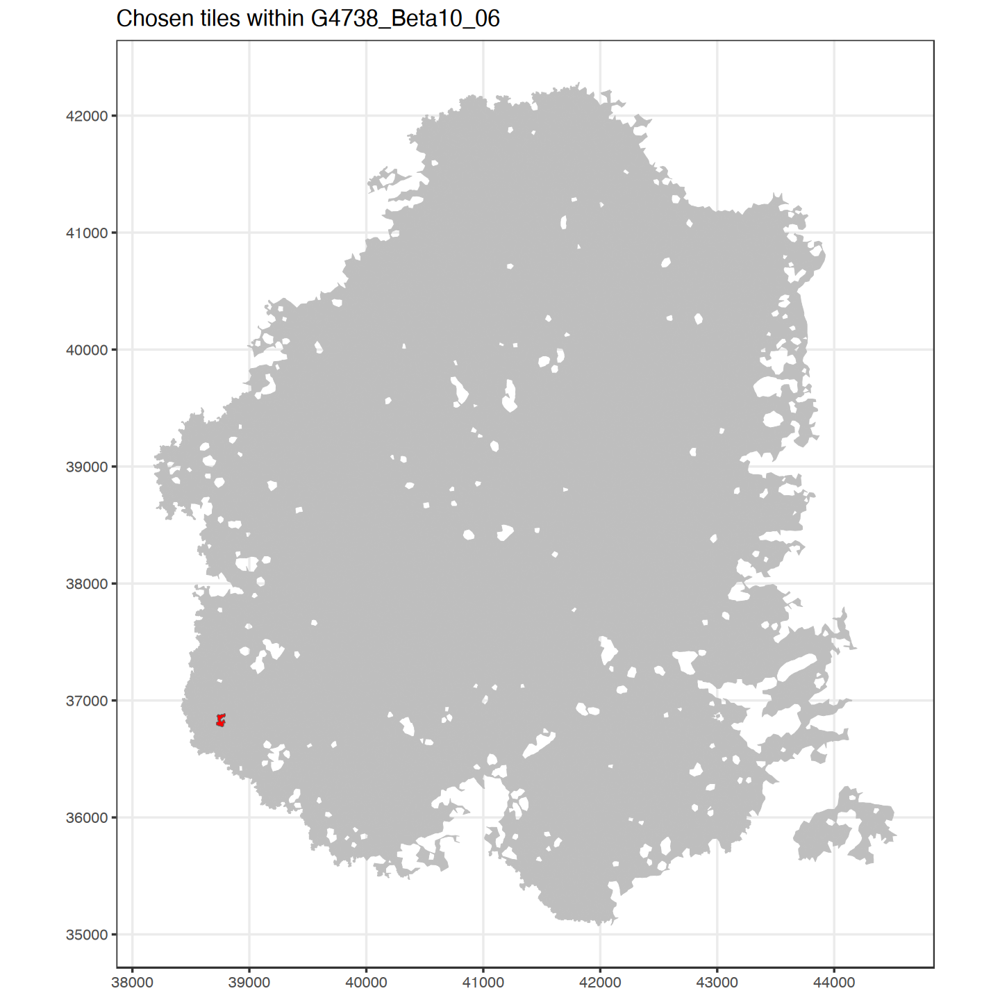

In [23]:
fig.size(12, 12)
i_tiles = 186823
.sample_id = unique(obj$tiles$meta_data$sample_id[i_tiles]) ## which slide is tile from? 
stopifnot(length(.sample_id) == 1)
plt_big = obj$tiles$meta_data[sample_id == .sample_id][, shape := refocus_bbox(shape)]
plt_focus = obj$tiles$meta_data[i_tiles, ][, shape := refocus_bbox(shape)]

ggplot() + 
    geom_sf(data = plt_big, aes(geometry = st_sfc(shape)), color = 'grey', fill = 'grey') + 
    geom_sf(data = plt_focus, aes(geometry = st_sfc(shape)), fill = 'red') + 
    labs(title = glue('Chosen tiles within {.sample_id}')) + 
    coord_sf() + 
    theme_bw(base_size = 16) + 
    NULL


OK, let's expand the view a little to look at neighboring tiles. 


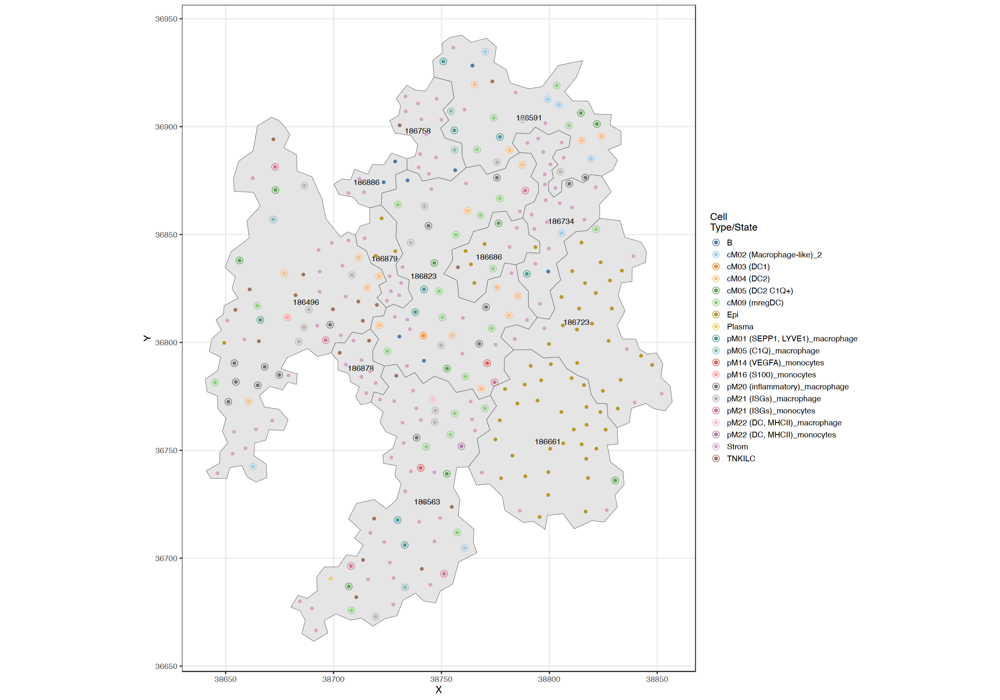

In [24]:
i_tiles = obj$tiles$edges[from == 186823 | to == 186823] %>% with(union(from, to))
i_cells = which(obj$cells$meta_data$agg_id %in% i_tiles)
plt_tiles = obj$tiles$meta_data[i_tiles, ][, shape := refocus_bbox(shape)]
plt_tiles$ID = i_tiles

fig.size(14, 20)
ggplot() + 
    geom_sf(aes(geometry = st_sfc(shape)), plt_tiles) + 
    geom_sf_text(aes(geometry = st_sfc(shape), label = ID), plt_tiles) + 
    geom_point(aes(X, Y, color = ClusterTop), obj$cells$meta_data[i_cells, ][ClusterTop != 'Myeloid']) + 
    geom_point(aes(X, Y, color = cleaned_fine_types), obj$cells$meta_data[i_cells, ][ClusterTop == 'Myeloid']) + 
    geom_point(aes(X, Y, color = cleaned_fine_types), shape = 21, fill = NA, obj$cells$meta_data[i_cells, ][ClusterTop == 'Myeloid'], size = 4) + 
    coord_sf() + 
    theme_bw(base_size = 14) + 
    scale_color_tableau('Tableau 20') + 
    labs(color = 'Cell\nType/State') + 
    NULL


For fun, let's go one more level out. 


In [25]:
i_tiles = 186823
for (i in 1:2) {
    i_tiles = obj$tiles$edges[from %in% i_tiles| to %in% i_tiles] %>% with(union(from, to)) 
}
i_cells = which(obj$cells$meta_data$agg_id %in% i_tiles)


In [ ]:
## recompute bbox for subsetted tiles
# plt_tiles = obj$tiles$meta_data[i_tiles, ]
plt_tiles = obj$tiles$meta_data[i_tiles, ][, shape := refocus_bbox(shape)]
plt_tiles$ID = i_tiles

## Need >20 colors here, so let's define a custom palette: 
pal = c(tableau_color_pal('Classic 20')(20), tableau_color_pal('Tableau 10')(10))

fig.size(14, 20)
ggplot() + 
    geom_sf(aes(geometry = st_sfc(shape)), plt_tiles) + 
    geom_sf_text(aes(geometry = st_sfc(shape), label = ID), plt_tiles) + 
    geom_point(aes(X, Y, color = ClusterTop), obj$cells$meta_data[i_cells, ][ClusterTop != 'Myeloid']) + 
    geom_point(aes(X, Y, color = cleaned_fine_types), obj$cells$meta_data[i_cells, ][ClusterTop == 'Myeloid']) + 
    geom_point(aes(X, Y, color = cleaned_fine_types), shape = 21, fill = NA, obj$cells$meta_data[i_cells, ][ClusterTop == 'Myeloid'], size = 4) + 
    coord_sf() + 
    theme_bw(base_size = 14) + 
    scale_color_manual(values = pal) + 
    labs(color = 'Cell\nType/State') + 
    NULL
